In [27]:
import pandas as pd
from datetime import date
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import MinMaxScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout,LSTM,Activation,RepeatVector
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures, ExpandingWindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

In [28]:
df = pd.read_csv('m-hsoldhst6312.txt', sep=' ')

In [29]:
df.head()

,year,mon,hsold,hstart
0,1963,1,42,79.0
1,1963,2,35,89.6
2,1963,3,44,124.8
3,1963,4,52,164.2
4,1963,5,58,172.7


In [30]:
df['Date'] = df['year'].astype(str)+' /'+df['mon'].astype(str)

In [31]:
df_new = df[['Date', 'hsold','hstart']]
df_new

,Date,hsold,hstart
0,1963 /1,42,79.0
1,1963 /2,35,89.6
2,1963 /3,44,124.8
3,1963 /4,52,164.2
4,1963 /5,58,172.7
...,...,...,...
590,2012 /3,34,58.0
591,2012 /4,34,66.8
592,2012 /5,35,67.8
593,2012 /6,34,74.7


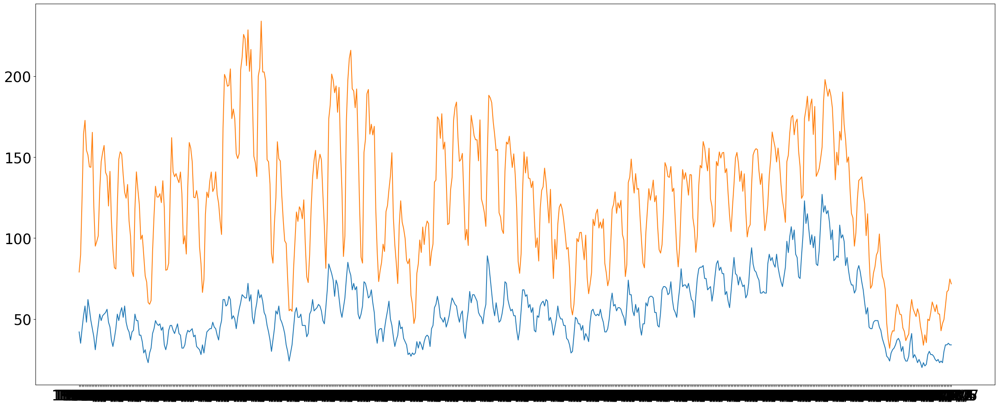

In [32]:
plt.figure(figsize=(30,12))
plt.plot(df_new['Date'],df_new['hsold'],label='hsold')
plt.plot(df_new['Date'],df_new['hstart'],label='hstart')
plt.rcParams["font.size"]="10"

In [33]:
df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Date']

C:\Users\User\AppData\Local\Temp\ipykernel_4608\35616042.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Date'] = pd.to_datetime(df_new['Date'])


0     1963-01-01
1     1963-02-01
2     1963-03-01
3     1963-04-01
4     1963-05-01
         ...    
590   2012-03-01
591   2012-04-01
592   2012-05-01
593   2012-06-01
594   2012-07-01
Name: Date, Length: 595, dtype: datetime64[ns]

In [34]:
df_ = df_new.copy()
df_

,Date,hsold,hstart
0,1963-01-01,42,79.0
1,1963-02-01,35,89.6
2,1963-03-01,44,124.8
3,1963-04-01,52,164.2
4,1963-05-01,58,172.7
...,...,...,...
590,2012-03-01,34,58.0
591,2012-04-01,34,66.8
592,2012-05-01,35,67.8
593,2012-06-01,34,74.7


In [35]:
#Date Time Features
df_['year']  = df_['Date'].dt.year
df_['month']  = df_['Date'].dt.month

In [36]:
#Lag features
df_[f"hsold_lag_1"] = df_["hsold"].shift(periods=1)
df_[f"hsold_lag_2"] = df_["hsold"].shift(periods=2)
df_[f"hsold_lag_3"] = df_["hsold"].shift(periods=3)
df_[f"hsold_lag_4"] = df_["hsold"].shift(periods=4)
df_[f"hsold_lag_5"] = df_["hsold"].shift(periods=5)
df_[f"hsold_lag_6"] = df_["hsold"].shift(periods=6)
df_[f"hsold_lag_7"] = df_["hsold"].shift(periods=7)
df_[f"hsold_lag_8"] = df_["hsold"].shift(periods=8)
df_[f"hsold_lag_12"] = df_["hsold"].shift(periods=12)
df_[f"hsold_lag_14"] = df_["hsold"].shift(periods=14)
df_[f"hsold_lag_16"] = df_["hsold"].shift(periods=16)
df_[f"hsold_lag_18"] = df_["hsold"].shift(periods=18)
df_[f"hsold_lag_20"] = df_["hsold"].shift(periods=20)
df_[f"hsold_lag_22"] = df_["hsold"].shift(periods=22)
df_[f"hsold_lag_24"] = df_["hsold"].shift(periods=24)
df_[f"hsold_lag_28"] = df_["hsold"].shift(periods=28)
df_[f"hsold_lag_30"] = df_["hsold"].shift(periods=30)


In [37]:
#Lag features
df_[f"hstart_lag_1"] = df_["hstart"].shift(periods=1)
df_[f"hstart_lag_2"] = df_["hstart"].shift(periods=2)
df_[f"hstart_lag_3"] = df_["hstart"].shift(periods=3)
df_[f"hstart_lag_4"] = df_["hstart"].shift(periods=4)
df_[f"hstart_lag_5"] = df_["hstart"].shift(periods=5)
df_[f"hstart_lag_6"] = df_["hstart"].shift(periods=6)
df_[f"hstart_lag_7"] = df_["hstart"].shift(periods=7)
df_[f"hstart_lag_8"] = df_["hstart"].shift(periods=8)
df_[f"hstart_lag_12"] = df_["hstart"].shift(periods=12)
df_[f"hstart_lag_14"] = df_["hstart"].shift(periods=14)
df_[f"hstart_lag_16"] = df_["hstart"].shift(periods=16)
df_[f"hstart_lag_18"] = df_["hstart"].shift(periods=18)
df_[f"hstart_lag_20"] = df_["hstart"].shift(periods=20)
df_[f"hstart_lag_22"] = df_["hstart"].shift(periods=22)
df_[f"hstart_lag_24"] = df_["hstart"].shift(periods=24)
df_[f"hstart_lag_28"] = df_["hstart"].shift(periods=28)
df_[f"hstart_lag_30"] = df_["hstart"].shift(periods=30)


In [38]:
#Rolling window feature
df_['rolling_mean_hsold_7'] = df_['hsold'].rolling(window=7).mean()
df_['rolling_mean_hsold_12'] = df_['hsold'].rolling(window=12).mean()
df_['rolling_mean_hsold_16'] = df_['hsold'].rolling(window=16).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=20).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=24).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=28).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=32).mean()
df_['rolling_mean_hsold_40'] = df_['hsold'].rolling(window=40).mean()
df_['rolling_mean_hsold_80'] = df_['hsold'].rolling(window=80).mean()
df_['rolling_mean_hsold_100'] = df_['hsold'].rolling(window=100).mean()
df_['rolling_mean_hsold_200'] = df_['hsold'].rolling(window=200).mean()

In [39]:
df_['rolling_mean_hstart_7'] = df_['hstart'].rolling(window=7).mean()
df_['rolling_mean_hstart_12'] = df_['hstart'].rolling(window=12).mean()
df_['rolling_mean_hstart_16'] = df_['hstart'].rolling(window=16).mean()
df_['rolling_mean_hstart_20'] = df_['hstart'].rolling(window=20).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=24).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=28).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=32).mean()
df_['rolling_mean_hstart_40'] = df_['hstart'].rolling(window=40).mean()
df_['rolling_mean_hstart_80'] = df_['hstart'].rolling(window=80).mean()
df_['rolling_mean_hstart_100'] = df_['hstart'].rolling(window=100).mean()
df_['rolling_mean_hstart_200'] = df_['hstart'].rolling(window=200).mean()

In [40]:
#Expanding Window feature
df_['expanding_mean_hstart_7'] = df_['hstart'].expanding(7).mean()
df_['expanding_mean_hstart_12'] = df_['hstart'].expanding(12).mean()
df_['expanding_mean_hstart_16'] = df_['hstart'].expanding(16).mean()
df_['expanding_mean_hstart_20'] = df_['hstart'].expanding(20).mean()
df_['expanding_mean_hstart_24'] = df_['hstart'].expanding(24).mean()
df_['expanding_mean_hstart_28'] = df_['hstart'].expanding(28).mean()
df_['expanding_mean_hstart_40'] = df_['hstart'].expanding(40).mean()
df_['expanding_mean_hstart_80'] = df_['hstart'].expanding(80).mean()
df_['expanding_mean_hstart_100'] = df_['hstart'].expanding(100).mean()
df_['expanding_mean_hstart_200'] = df_['hstart'].expanding(200).mean()

In [41]:
#Expanding Window feature
df_['expanding_mean_hsold_7'] = df_['hsold'].expanding(7).mean()
df_['expanding_mean_hsold_12'] = df_['hsold'].expanding(12).mean()
df_['expanding_mean_hsold_16'] = df_['hsold'].expanding(16).mean()
df_['expanding_mean_hsold_20'] = df_['hsold'].expanding(20).mean()
df_['expanding_mean_hsold_24'] = df_['hsold'].expanding(24).mean()
df_['expanding_mean_hsold_28'] = df_['hsold'].expanding(28).mean()
df_['expanding_mean_hsold_40'] = df_['hsold'].expanding(40).mean()
df_['expanding_mean_hsold_80'] = df_['hsold'].expanding(80).mean()
df_['expanding_mean_hsold_100'] = df_['hsold'].expanding(100).mean()
df_['expanding_mean_hsold_200'] = df_['hsold'].expanding(200).mean()

In [42]:
#Remove seasonality using differencing
df_['hsold_diff_1'] = df_['hsold'] - df_["hsold"].shift(periods=1)
df_['hsold_diff_2'] = df_['hsold'] - df_["hsold"].shift(periods=2)
df_['hsold_diff_3'] = df_['hsold'] - df_["hsold"].shift(periods=3)
df_['hsold_diff_4'] = df_['hsold'] - df_["hsold"].shift(periods=4)
df_['hsold_diff_7'] = df_['hsold'] - df_["hsold"].shift(periods=7)
df_['hsold_diff_12'] = df_['hsold'] - df_["hsold"].shift(periods=12)


df_['hstart_diff_1'] = df_['hstart'] - df_["hstart"].shift(periods=1)
df_['hstart_diff_2'] = df_['hstart'] - df_["hstart"].shift(periods=2)
df_['hstart_diff_3'] = df_['hstart'] - df_["hstart"].shift(periods=3)
df_['hstart_diff_4'] = df_['hstart'] - df_["hstart"].shift(periods=4)
df_['hstart_diff_7'] = df_['hstart'] - df_["hstart"].shift(periods=7)
df_['hstart_diff_12'] = df_['hstart'] - df_["hstart"].shift(periods=12)



In [43]:
df_

,Date,hsold,hstart,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963-01-01,42,79.0,1963,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1963-02-01,35,89.6,1963,2,42.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,10.6,NaN,NaN,NaN,NaN,NaN
2,1963-03-01,44,124.8,1963,3,35.0,42.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,35.2,45.8,NaN,NaN,NaN,NaN
3,1963-04-01,52,164.2,1963,4,44.0,35.0,42.0,NaN,NaN,...,10.0,NaN,NaN,NaN,39.4,74.6,85.2,NaN,NaN,NaN
4,1963-05-01,58,172.7,1963,5,52.0,44.0,35.0,42.0,NaN,...,23.0,16.0,NaN,NaN,8.5,47.9,83.1,93.7,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012-03-01,34,58.0,2012,3,30.0,23.0,24.0,23.0,25.0,...,10.0,11.0,9.0,6.0,8.3,10.8,15.3,5.0,3.5,8.1
591,2012-04-01,34,66.8,2012,4,34.0,30.0,23.0,24.0,23.0,...,11.0,10.0,10.0,4.0,8.8,17.1,19.6,24.1,8.0,17.8
592,2012-05-01,35,67.8,2012,5,34.0,34.0,30.0,23.0,24.0,...,5.0,12.0,10.0,7.0,1.0,9.8,18.1,20.6,14.6,13.8
593,2012-06-01,34,74.7,2012,6,35.0,34.0,34.0,30.0,23.0,...,0.0,4.0,11.0,6.0,6.9,7.9,16.7,25.0,21.7,14.2


In [44]:
df = df_.fillna(0)

# Random Forest

In [45]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [46]:
X

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012,3,30.0,23.0,24.0,23.0,25.0,24.0,25.0,27.0,...,10.0,11.0,9.0,6.0,8.3,10.8,15.3,5.0,3.5,8.1
591,2012,4,34.0,30.0,23.0,24.0,23.0,25.0,24.0,25.0,...,11.0,10.0,10.0,4.0,8.8,17.1,19.6,24.1,8.0,17.8
592,2012,5,34.0,34.0,30.0,23.0,24.0,23.0,25.0,24.0,...,5.0,12.0,10.0,7.0,1.0,9.8,18.1,20.6,14.6,13.8
593,2012,6,35.0,34.0,34.0,30.0,23.0,24.0,23.0,25.0,...,0.0,4.0,11.0,6.0,6.9,7.9,16.7,25.0,21.7,14.2


In [47]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]

In [48]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]

In [49]:
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [50]:
model_rf = RandomForestClassifier()

In [51]:
#fit the model
model_rf.fit(train_data_x,train_data_y)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.03361344537815126


In [52]:
model_rf.feature_importances_

array([0.00602898, 0.01002413, 0.02631032, 0.01680687, 0.0129278 ,
       0.01202296, 0.00980778, 0.01276788, 0.01326271, 0.01309313,
       0.01726655, 0.00919108, 0.01172448, 0.01183546, 0.01301348,
       0.0116413 , 0.01436461, 0.00953102, 0.01221692, 0.01399903,
       0.01293133, 0.01292099, 0.01303952, 0.01365469, 0.01270581,
       0.01267614, 0.0121411 , 0.01324979, 0.01102376, 0.01294966,
       0.01340752, 0.01209737, 0.01272878, 0.01155187, 0.01317911,
       0.01445754, 0.01807937, 0.01536269, 0.01392692, 0.00965271,
       0.01103878, 0.00905719, 0.00756847, 0.00692456, 0.01055044,
       0.01199427, 0.00998771, 0.01062403, 0.0098871 , 0.0087952 ,
       0.00914867, 0.00855407, 0.00823858, 0.00924873, 0.00965498,
       0.00909516, 0.00788784, 0.00821625, 0.00851809, 0.00756483,
       0.00794268, 0.00753126, 0.00670101, 0.00900679, 0.00899995,
       0.00748828, 0.00856775, 0.00826131, 0.00886927, 0.00917369,
       0.00683603, 0.00767521, 0.00569725, 0.01474682, 0.01637

In [53]:
model_rf.feature_names_in_


array(['year', 'month', 'hsold_lag_1', 'hsold_lag_2', 'hsold_lag_3',
       'hsold_lag_4', 'hsold_lag_5', 'hsold_lag_6', 'hsold_lag_7',
       'hsold_lag_8', 'hsold_lag_12', 'hsold_lag_14', 'hsold_lag_16',
       'hsold_lag_18', 'hsold_lag_20', 'hsold_lag_22', 'hsold_lag_24',
       'hsold_lag_28', 'hsold_lag_30', 'hstart_lag_1', 'hstart_lag_2',
       'hstart_lag_3', 'hstart_lag_4', 'hstart_lag_5', 'hstart_lag_6',
       'hstart_lag_7', 'hstart_lag_8', 'hstart_lag_12', 'hstart_lag_14',
       'hstart_lag_16', 'hstart_lag_18', 'hstart_lag_20', 'hstart_lag_22',
       'hstart_lag_24', 'hstart_lag_28', 'hstart_lag_30',
       'rolling_mean_hsold_7', 'rolling_mean_hsold_12',
       'rolling_mean_hsold_16', 'rolling_mean_hsold_20',
       'rolling_mean_hsold_40', 'rolling_mean_hsold_80',
       'rolling_mean_hsold_100', 'rolling_mean_hsold_200',
       'rolling_mean_hstart_7', 'rolling_mean_hstart_12',
       'rolling_mean_hstart_16', 'rolling_mean_hstart_20',
       'rolling_mean_hstart_2

<BarContainer object of 85 artists>

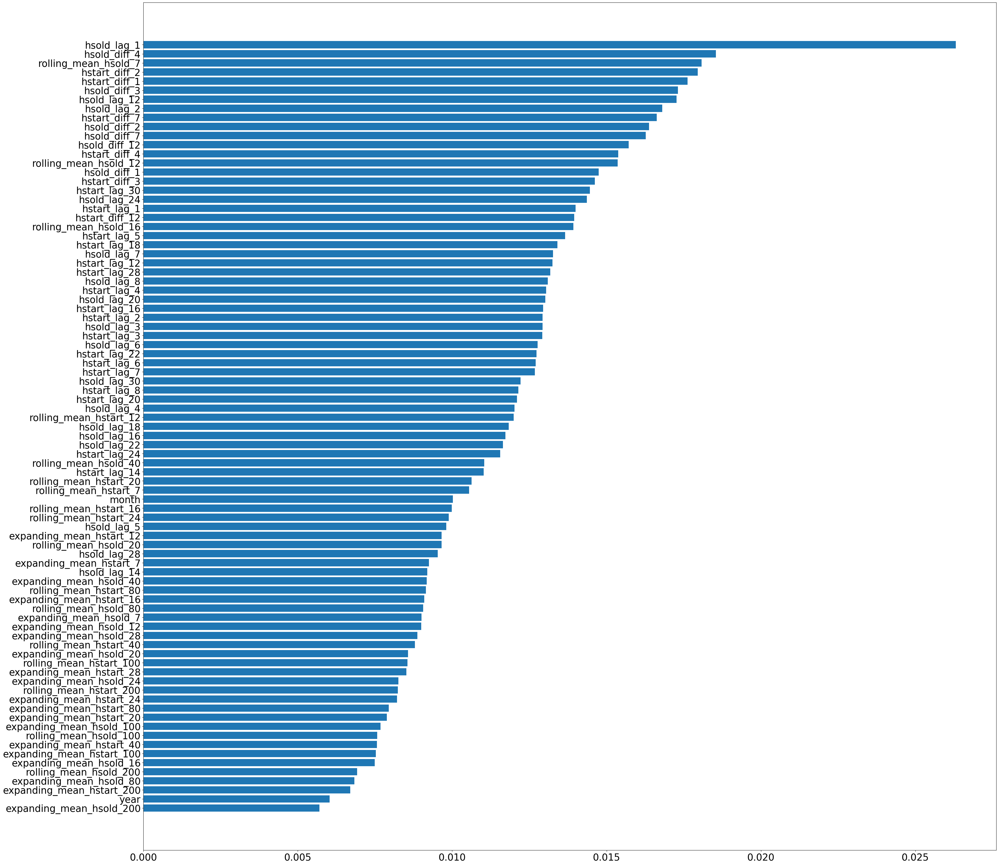

In [54]:
importances_df = pd.DataFrame({"feature_names" : model_rf.feature_names_in_, 
                               "importances" : model_rf.feature_importances_})

importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])
#g.set_title("Feature importances", fontsize=25);                          


# RandomForest hstart data

In [55]:
#Splitting data into x,y
y_hstart = df["hstart"].astype(int)

X_hstart =df.drop(["Date","hsold","hstart"],axis=1)

In [56]:
train_size = int(len(X_hstart)*0.8)
test_size_x = len(X_hstart) - train_size
train_data_x_hstart = X_hstart[:train_size]
test_data_x_hstart =  X_hstart[train_size:]

In [57]:
train_size = int(len(y_hstart)*0.8)
test_size_y = len(y_hstart) - train_size
train_data_y_hstart = y_hstart[:train_size]
test_data_y_hstart =  y_hstart[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [58]:
model_rf_hstart = RandomForestClassifier()


In [59]:
model_rf_hstart.fit(train_data_x_hstart,train_data_y_hstart)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)


0.0


<BarContainer object of 85 artists>

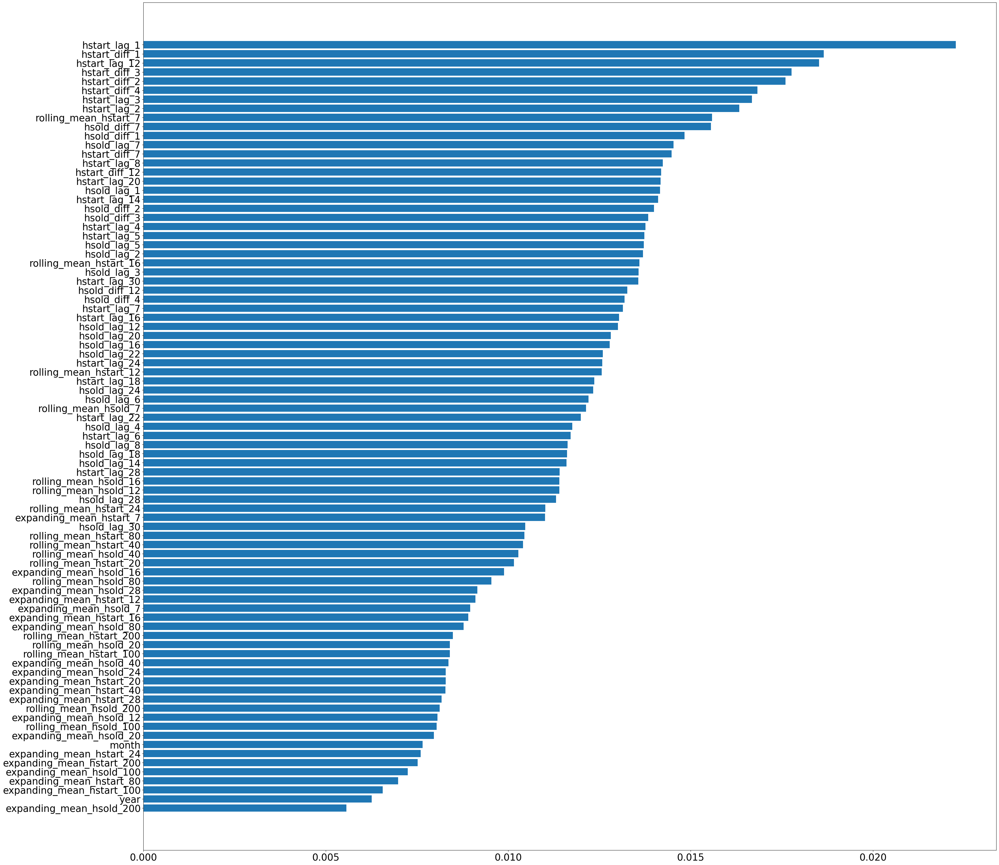

In [60]:
importances_df = pd.DataFrame({"feature_names" : model_rf_hstart.feature_names_in_, 
                               "importances" : model_rf_hstart.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                  
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

In [61]:
#Correlation
cor = df.corr()
top_corr_features = cor.index
plt.figure(figsize=(100,100))
g = sb.heatmap(df_[top_corr_features].corr(),annot=True,)

C:\Users\User\AppData\Local\Temp\ipykernel_4608\1298823419.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


# XGB classifier

In [63]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [64]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [65]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [66]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y = le.fit_transform(train_data_y)
test_data_y = le.fit_transform(test_data_y)
train_data_y.shape

(476,)

In [67]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x,train_data_y)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [68]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.05042016806722689


<BarContainer object of 85 artists>

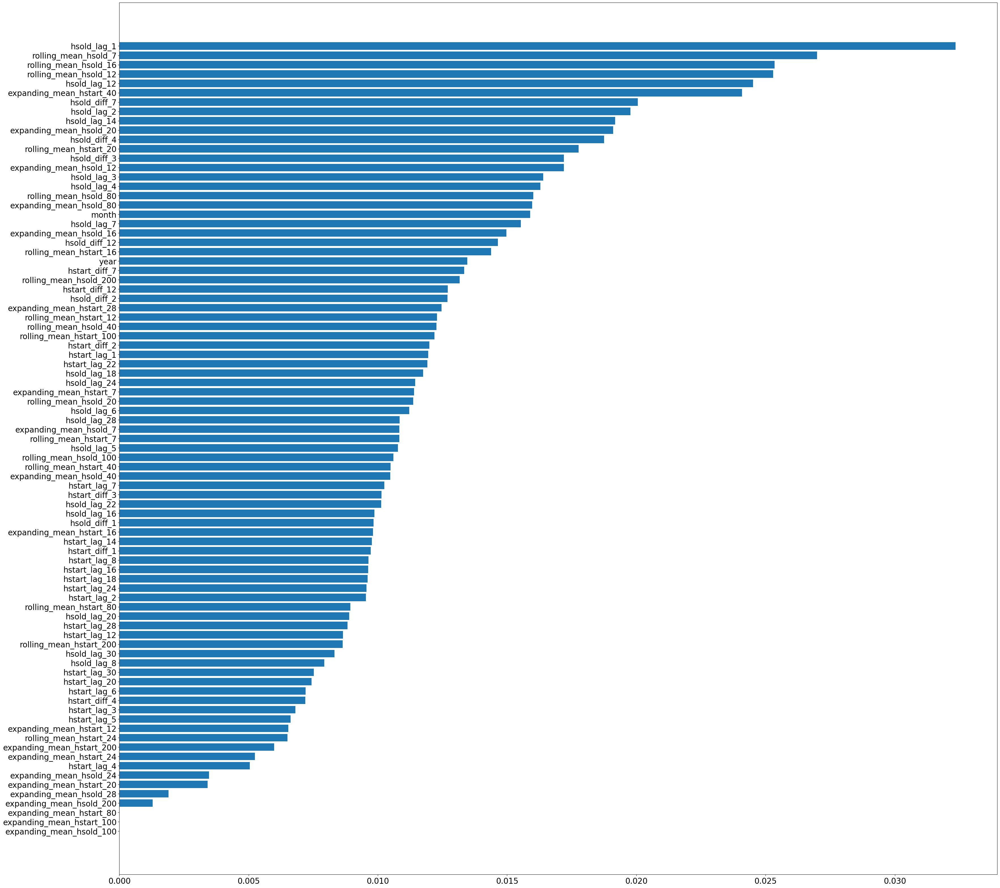

In [69]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   
                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# XGB For hstart

In [70]:
#Splitting data into x,y
y =df["hstart"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [71]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [72]:
train_size = int(len(y)*0.8)
test_size = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79.0
1       89.6
2      124.8
3      164.2
4      172.7
       ...  
471    148.8
472    165.5
473    160.3
474    155.9
475    147.0
Name: hstart, Length: 476, dtype: float64

In [73]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y_hstart = le.fit_transform(train_data_y_hstart)
train_data_y_hstart.shape
test_data_y_hstart = le.fit_transform(test_data_y_hstart)

In [74]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x_hstart,train_data_y_hstart)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [75]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.0


<BarContainer object of 85 artists>

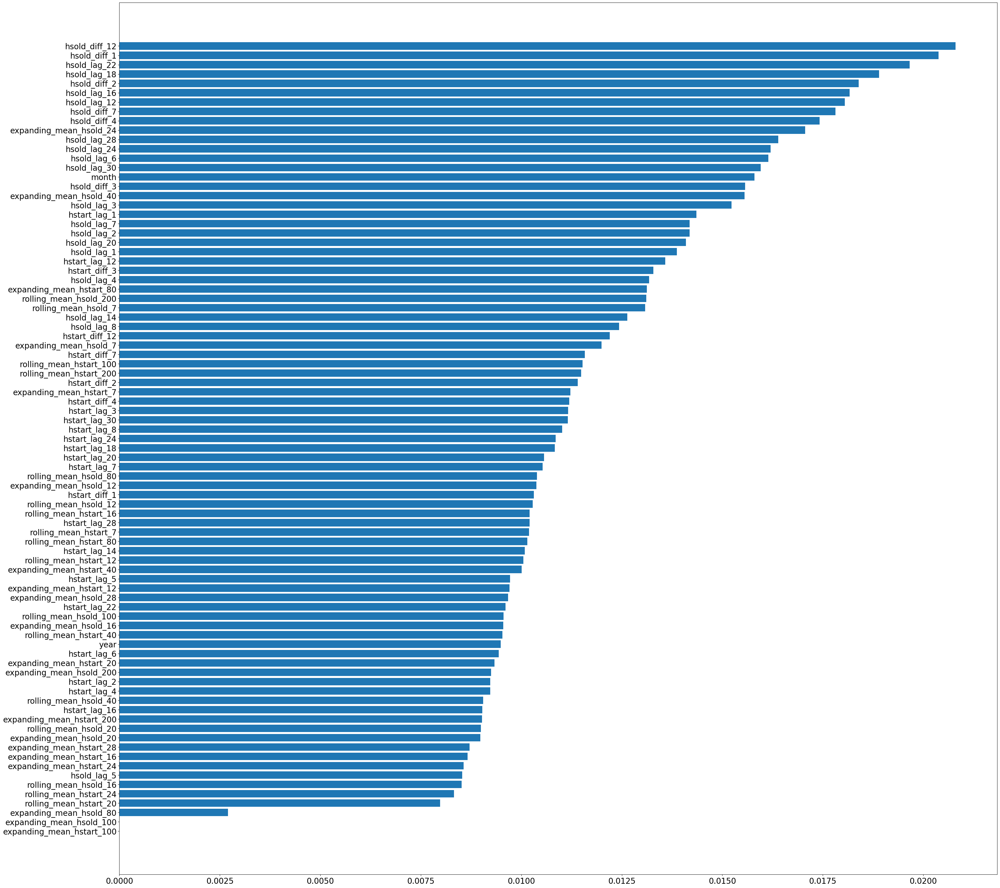

In [76]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   

# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree classifier

In [77]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [78]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [79]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [80]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x,train_data_y)

DecisionTreeClassifier()

In [81]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.025210084033613446


<BarContainer object of 85 artists>

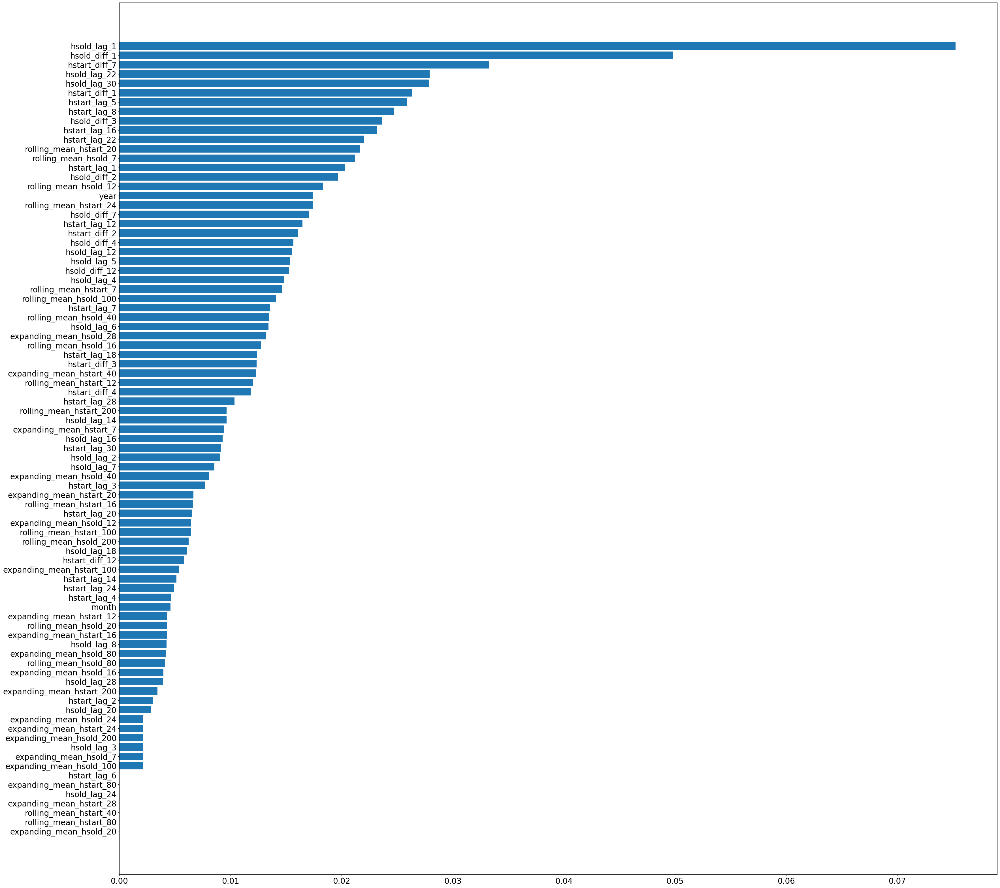

In [82]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)              
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree hstart

In [83]:
#Splitting data into x,y
y =df["hstart"].astype(int)
X =df.drop(["Date","hsold","hstart"],axis=1)

In [84]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [85]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [86]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x_hstart,train_data_y_hstart)

DecisionTreeClassifier()

In [87]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.03361344537815126


<BarContainer object of 85 artists>

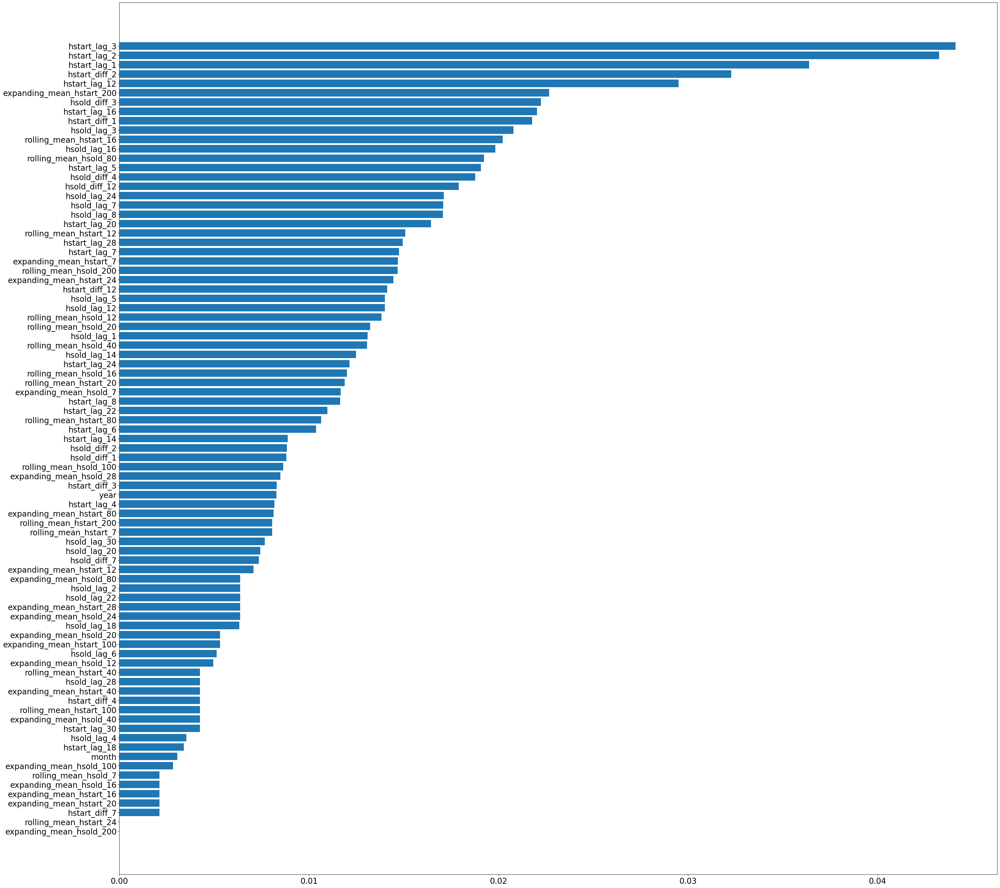

In [88]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Regression Models

# RandomForest Regression hsold

In [89]:
#Random forest regressor
data_set_y  =df["hsold"]
data_set_x = df[['hsold_lag_1','hstart_diff_2',
                  'hsold_lag_12','hstart_diff_1',
                  'hsold_diff_7'
                ]]


In [90]:
data_set_x_2 = df[['hsold_lag_1','hstart_diff_2',
                  'hsold_lag_12','hstart_diff_1',
                  'hsold_diff_7','rolling_mean_hsold_7',
                   'hstart_diff_3'
                ]]

In [91]:
train_size = int(len(data_set_x)*0.8)
test_size_x = len(data_set_x) - train_size
train_data_x = data_set_x[:train_size]
test_data_x =  data_set_x[train_size:]
train_data_x

,hsold_lag_1,hstart_diff_2,hsold_lag_12,hstart_diff_1,hsold_diff_7
0,0.0,0.0,0.0,0.0,0.0
1,42.0,0.0,0.0,10.6,0.0
2,35.0,45.8,0.0,35.2,0.0
3,44.0,74.6,0.0,39.4,0.0
4,52.0,47.9,0.0,8.5,0.0
...,...,...,...,...,...
471,90.0,28.4,84.0,10.6,20.0
472,86.0,27.3,80.0,16.7,22.0
473,88.0,11.5,79.0,-5.2,17.0
474,84.0,-9.6,76.0,-4.4,16.0


In [92]:
train_size = int(len(data_set_y)*0.8)
test_size_y = len(data_set_y) - train_size
train_data_y = data_set_y[:train_size]
test_data_y =  data_set_y[train_size:]

In [93]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x, train_data_y)


RandomForestRegressor(random_state=0)

In [94]:
y_pred = regressor.predict(test_data_x)

In [95]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y,y_pred)

rmse = np.sqrt(mse)
rmse

13.074781711628027

# dataset x1hsold with 3 features

In [96]:
data_set_y  =df["hsold"]
data_set_x_1 = df[['hsold_lag_1','hstart_diff_2',
                  'hsold_lag_12']]

In [97]:
train_size = int(len(data_set_x_1)*0.8)
test_size_x_1 = len(data_set_x_1) - train_size
train_data_x_1 = data_set_x_1[:train_size]
test_data_x_1 =  data_set_x_1[train_size:]
train_data_x_1

,hsold_lag_1,hstart_diff_2,hsold_lag_12
0,0.0,0.0,0.0
1,42.0,0.0,0.0
2,35.0,45.8,0.0
3,44.0,74.6,0.0
4,52.0,47.9,0.0
...,...,...,...
471,90.0,28.4,84.0
472,86.0,27.3,80.0
473,88.0,11.5,79.0
474,84.0,-9.6,76.0


In [98]:
train_size = int(len(data_set_y)*0.8)
test_size_y = len(data_set_y) - train_size
train_data_y = data_set_y[:train_size]
test_data_y =  data_set_y[train_size:]

In [99]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x_1, train_data_y)

RandomForestRegressor(random_state=0)

In [100]:
y_pred = regressor.predict(test_data_x_1)

In [101]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y,y_pred)

rmse = np.sqrt(mse)
rmse

12.251326424500489

# dataset x2hsold with 7 features

In [102]:
#Random forest regressor
data_set_y  =df["hsold"]
data_set_x_2 = df[['hsold_lag_1','hstart_diff_2',
                  'hsold_lag_12','hstart_diff_1',
                  'hsold_diff_7','rolling_mean_hsold_7',
                   'hstart_diff_3'
                ]]

In [103]:
train_size = int(len(data_set_x_2)*0.8)
test_size_x_2 = len(data_set_x_2) - train_size
train_data_x_2 = data_set_x_2[:train_size]
test_data_x_2 =  data_set_x_2[train_size:]
train_data_x_2

,hsold_lag_1,hstart_diff_2,hsold_lag_12,hstart_diff_1,hsold_diff_7,rolling_mean_hsold_7,hstart_diff_3
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,42.0,0.0,0.0,10.6,0.0,0.000000,0.0
2,35.0,45.8,0.0,35.2,0.0,0.000000,0.0
3,44.0,74.6,0.0,39.4,0.0,0.000000,85.2
4,52.0,47.9,0.0,8.5,0.0,0.000000,83.1
...,...,...,...,...,...,...,...
471,90.0,28.4,84.0,10.6,20.0,75.000000,38.4
472,86.0,27.3,80.0,16.7,22.0,78.142857,45.1
473,88.0,11.5,79.0,-5.2,17.0,80.571429,22.1
474,84.0,-9.6,76.0,-4.4,16.0,82.857143,7.1


In [104]:
train_size = int(len(data_set_y)*0.8)
test_size_y = len(data_set_y) - train_size
train_data_y = data_set_y[:train_size]
test_data_y =  data_set_y[train_size:]

In [105]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x_2, train_data_y)

RandomForestRegressor(random_state=0)

In [106]:
y_pred = regressor.predict(test_data_x_2)

In [107]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y,y_pred)

rmse = np.sqrt(mse)
rmse

12.817547878336379

# Random Forest hstart

In [108]:
#Random forest regressor
data_set_y_hstart  =df["hstart"]
data_set_x_hstart = df[['hstart_lag_1','hstart_diff_3',
                 'hstart_diff_1','hstart_diff_4',
                 'hstart_lag_12'
                ]]

In [109]:
train_size = int(len(data_set_x_hstart)*0.8)
test_size_x = len(data_set_x_hstart) - train_size
train_data_x_hstart = data_set_x_hstart[:train_size]
test_data_x_hstart =  data_set_x_hstart[train_size:]
train_data_x_hstart

,hstart_lag_1,hstart_diff_3,hstart_diff_1,hstart_diff_4,hstart_lag_12
0,0.0,0.0,0.0,0.0,0.0
1,79.0,0.0,10.6,0.0,0.0
2,89.6,0.0,35.2,0.0,0.0
3,124.8,85.2,39.4,0.0,0.0
4,164.2,83.1,8.5,93.7,0.0
...,...,...,...,...,...
471,138.2,38.4,10.6,44.2,151.3
472,148.8,45.1,16.7,55.1,154.0
473,165.5,22.1,-5.2,39.9,155.2
474,160.3,7.1,-4.4,17.7,154.6


In [110]:
train_size = int(len(data_set_y_hstart)*0.8)
test_size_y = len(data_set_y_hstart) - train_size
train_data_y_hstart = data_set_y_hstart[:train_size]
test_data_y_hstart =  data_set_y_hstart[train_size:]

In [111]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x_hstart, train_data_y_hstart)

RandomForestRegressor(random_state=0)

In [112]:
y_pred_hstart = regressor.predict(test_data_x_hstart)

In [113]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart,y_pred_hstart)

rmse = np.sqrt(mse)
rmse

15.936533428392947

# randomforest regression hstart freatures 3

In [114]:
#Random forest regressor
data_set_y_hstart  =df["hstart"]
data_set_x_hstart_1 = df[['hstart_lag_1','hstart_diff_3',
                         'hstart_diff_1']]

In [115]:
train_size = int(len(data_set_x_hstart_1)*0.8)
test_size_x = len(data_set_x_hstart_1) - train_size
train_data_x_hstart_1 = data_set_x_hstart_1[:train_size]
test_data_x_hstart_1 =  data_set_x_hstart_1[train_size:]
train_data_x_hstart_1

,hstart_lag_1,hstart_diff_3,hstart_diff_1
0,0.0,0.0,0.0
1,79.0,0.0,10.6
2,89.6,0.0,35.2
3,124.8,85.2,39.4
4,164.2,83.1,8.5
...,...,...,...
471,138.2,38.4,10.6
472,148.8,45.1,16.7
473,165.5,22.1,-5.2
474,160.3,7.1,-4.4


In [116]:
train_size = int(len(data_set_y_hstart)*0.8)
test_size_y = len(data_set_y_hstart) - train_size
train_data_y_hstart = data_set_y_hstart[:train_size]
test_data_y_hstart =  data_set_y_hstart[train_size:]

In [117]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x_hstart_1, train_data_y_hstart)

RandomForestRegressor(random_state=0)

In [118]:
y_pred_hstart_1 = regressor.predict(test_data_x_hstart_1)

In [119]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart,y_pred_hstart_1)

rmse = np.sqrt(mse)
rmse

15.386533012438415

# randomforest regression hstart freatures 7

In [120]:
#Random forest regressor
data_set_y_hstart  =df["hstart"]
data_set_x_hstart_2= df[['hstart_lag_1','hstart_diff_3',
                         'hstart_diff_1','hstart_diff_4',
                       'hstart_lag_12','hstart_diff_2',
                        'rolling_mean_hstart_7']]

In [121]:
train_size = int(len(data_set_x_hstart_2)*0.8)
test_size_x = len(data_set_x_hstart_2) - train_size
train_data_x_hstart_2 = data_set_x_hstart_2[:train_size]
test_data_x_hstart_2 =  data_set_x_hstart_2[train_size:]
train_data_x_hstart_2

,hstart_lag_1,hstart_diff_3,hstart_diff_1,hstart_diff_4,hstart_lag_12,hstart_diff_2,rolling_mean_hstart_7
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,79.0,0.0,10.6,0.0,0.0,0.0,0.000000
2,89.6,0.0,35.2,0.0,0.0,45.8,0.000000
3,124.8,85.2,39.4,0.0,0.0,74.6,0.000000
4,164.2,83.1,8.5,93.7,0.0,47.9,0.000000
...,...,...,...,...,...,...,...
471,138.2,38.4,10.6,44.2,151.3,28.4,126.171429
472,148.8,45.1,16.7,55.1,154.0,27.3,129.842857
473,165.5,22.1,-5.2,39.9,155.2,11.5,135.457143
474,160.3,7.1,-4.4,17.7,154.6,-9.6,142.785714


In [122]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor

# create regressor object
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

# fit the regressor with x and y data
regressor.fit(train_data_x_hstart_2, train_data_y_hstart)

RandomForestRegressor(random_state=0)

In [123]:
y_pred_hstart_2 = regressor.predict(test_data_x_hstart_2)

In [124]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart,y_pred_hstart_2)

rmse = np.sqrt(mse)
rmse

16.00387400211681

# XGB Regressor

In [125]:
#XGB regressor
data_set_y_hsold_xgb  =df["hsold"]
data_set_x_hsold_xgb = df[['hsold_lag_1','rolling_mean_hsold_7',
                       'rolling_mean_hsold_16','rolling_mean_hsold_12',
                       'hsold_lag_12'
                ]]

In [126]:
train_size = int(len(data_set_x_hsold_xgb)*0.8)
test_size_x = len(data_set_x_hsold_xgb) - train_size
train_data_x_hsold_xgb = data_set_x_hsold_xgb[:train_size]
test_data_x_hsold_xgb =  data_set_x_hsold_xgb[train_size:]
train_data_x_hsold_xgb

,hsold_lag_1,rolling_mean_hsold_7,rolling_mean_hsold_16,rolling_mean_hsold_12,hsold_lag_12
0,0.0,0.000000,0.0000,0.000000,0.0
1,42.0,0.000000,0.0000,0.000000,0.0
2,35.0,0.000000,0.0000,0.000000,0.0
3,44.0,0.000000,0.0000,0.000000,0.0
4,52.0,0.000000,0.0000,0.000000,0.0
...,...,...,...,...,...
471,90.0,75.000000,77.1875,75.000000,84.0
472,86.0,78.142857,78.1875,75.666667,80.0
473,88.0,80.571429,78.1250,76.083333,79.0
474,84.0,82.857143,77.3750,76.583333,76.0


In [127]:
train_size = int(len(data_set_y_hsold_xgb)*0.8)
test_size_y_hsold_xgb = len(data_set_y_hsold_xgb ) - train_size
train_data_y_hsold_xgb  = data_set_y_hsold_xgb [:train_size]
test_data_y_hsold_xgb  =  data_set_y_hsold_xgb [train_size:]

In [128]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [129]:
model_xgb_regressor.fit(train_data_x_hsold_xgb,train_data_y_hsold_xgb,
                       eval_set=[(train_data_x_hsold_xgb,train_data_y_hsold_xgb),(test_data_x_hsold_xgb,test_data_y_hsold_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [130]:
y_pred_hosld_xgb = model_xgb_regressor.predict(test_data_x_hsold_xgb)

In [131]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hsold_xgb,y_pred_hosld_xgb)

rmse = np.sqrt(mse)
rmse

11.139824351428798

# XGB regressor three features

In [132]:
#XGB regressor
data_set_y_hsold_xgb  =df["hsold"]
data_set_x_hsold_xgb_1 = df[['hsold_lag_1','rolling_mean_hsold_7',
                       'rolling_mean_hsold_16',
                ]]

In [133]:
train_size = int(len(data_set_x_hsold_xgb_1)*0.8)
test_size_x = len(data_set_x_hsold_xgb_1) - train_size
train_data_x_hsold_xgb_1 = data_set_x_hsold_xgb_1[:train_size]
test_data_x_hsold_xgb_1 =  data_set_x_hsold_xgb_1[train_size:]
train_data_x_hsold_xgb_1

,hsold_lag_1,rolling_mean_hsold_7,rolling_mean_hsold_16
0,0.0,0.000000,0.0000
1,42.0,0.000000,0.0000
2,35.0,0.000000,0.0000
3,44.0,0.000000,0.0000
4,52.0,0.000000,0.0000
...,...,...,...
471,90.0,75.000000,77.1875
472,86.0,78.142857,78.1875
473,88.0,80.571429,78.1250
474,84.0,82.857143,77.3750


In [134]:
train_size = int(len(data_set_y_hsold_xgb)*0.8)
test_size_y_hsold_xgb = len(data_set_y_hsold_xgb ) - train_size
train_data_y_hsold_xgb  = data_set_y_hsold_xgb [:train_size]
test_data_y_hsold_xgb  =  data_set_y_hsold_xgb [train_size:]

In [135]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [136]:
model_xgb_regressor.fit(train_data_x_hsold_xgb_1,train_data_y_hsold_xgb,
                       eval_set=[(train_data_x_hsold_xgb_1,train_data_y_hsold_xgb),(test_data_x_hsold_xgb_1,test_data_y_hsold_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [137]:
y_pred_hosld_xgb_1 = model_xgb_regressor.predict(test_data_x_hsold_xgb_1)

In [138]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hsold_xgb,y_pred_hosld_xgb_1)

rmse = np.sqrt(mse)
rmse

11.282813229508921

# XGB regressor 7 features

In [139]:
#XGB regressor
data_set_y_hsold_xgb  =df["hsold"]
data_set_x_hsold_xgb_2 = df[['hsold_lag_1','rolling_mean_hsold_7',
                             'rolling_mean_hsold_16','rolling_mean_hsold_12',
                              'hsold_lag_12','expanding_mean_hstart_40',
                             'hsold_diff_7'
                ]]

In [140]:
train_size = int(len(data_set_x_hsold_xgb_2)*0.8)
test_size_x = len(data_set_x_hsold_xgb_2) - train_size
train_data_x_hsold_xgb_2 = data_set_x_hsold_xgb_2[:train_size]
test_data_x_hsold_xgb_2 =  data_set_x_hsold_xgb_2[train_size:]
train_data_x_hsold_xgb_2

,hsold_lag_1,rolling_mean_hsold_7,rolling_mean_hsold_16,rolling_mean_hsold_12,hsold_lag_12,expanding_mean_hstart_40,hsold_diff_7
0,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.0
1,42.0,0.000000,0.0000,0.000000,0.0,0.000000,0.0
2,35.0,0.000000,0.0000,0.000000,0.0,0.000000,0.0
3,44.0,0.000000,0.0000,0.000000,0.0,0.000000,0.0
4,52.0,0.000000,0.0000,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...
471,90.0,75.000000,77.1875,75.000000,84.0,127.197246,20.0
472,86.0,78.142857,78.1875,75.666667,80.0,127.278224,22.0
473,88.0,80.571429,78.1250,76.083333,79.0,127.347890,17.0
474,84.0,82.857143,77.3750,76.583333,76.0,127.408000,16.0


In [141]:
train_size = int(len(data_set_y_hsold_xgb)*0.8)
test_size_y_hsold_xgb = len(data_set_y_hsold_xgb ) - train_size
train_data_y_hsold_xgb  = data_set_y_hsold_xgb [:train_size]
test_data_y_hsold_xgb  =  data_set_y_hsold_xgb [train_size:]

In [142]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [143]:
model_xgb_regressor.fit(train_data_x_hsold_xgb_2,train_data_y_hsold_xgb,
                       eval_set=[(train_data_x_hsold_xgb_2,train_data_y_hsold_xgb),(test_data_x_hsold_xgb_2,test_data_y_hsold_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [144]:
y_pred_hosld_xgb_2 = model_xgb_regressor.predict(test_data_x_hsold_xgb_2)

In [145]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hsold_xgb,y_pred_hosld_xgb_2)

rmse = np.sqrt(mse)
rmse

13.882025151676189

# XGB hstart Rgressor

In [146]:
#XGB regressor
data_set_y_hstart_xgb  =df["hstart"]
data_set_x_hstart_xgb = df[['hsold_diff_12','hsold_diff_1',
                           'hsold_lag_22','hsold_lag_18',
                           'hsold_diff_2']]

In [147]:
train_size = int(len(data_set_x_hstart_xgb)*0.8)
test_size_x = len(data_set_x_hstart_xgb) - train_size
train_data_x_hstart_xgb = data_set_x_hstart_xgb[:train_size]
test_data_x_hstart_xgb =  data_set_x_hstart_xgb[train_size:]
train_data_x_hstart_xgb

,hsold_diff_12,hsold_diff_1,hsold_lag_22,hsold_lag_18,hsold_diff_2
0,0.0,0.0,0.0,0.0,0.0
1,0.0,-7.0,0.0,0.0,0.0
2,0.0,9.0,0.0,0.0,2.0
3,0.0,8.0,0.0,0.0,17.0
4,0.0,6.0,0.0,0.0,14.0
...,...,...,...,...,...
471,2.0,-4.0,71.0,71.0,2.0
472,8.0,2.0,76.0,63.0,-2.0
473,5.0,-4.0,73.0,65.0,-2.0
474,6.0,-2.0,70.0,72.0,-6.0


In [148]:
train_size = int(len(data_set_y_hstart_xgb)*0.8)
test_size_y_hstart_xgb = len(data_set_y_hstart_xgb ) - train_size
train_data_y_hstart_xgb  = data_set_y_hstart_xgb [:train_size]
test_data_y_hstart_xgb  =  data_set_y_hstart_xgb [train_size:]

In [149]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [150]:
model_xgb_regressor.fit(train_data_x_hstart_xgb,train_data_y_hstart_xgb,
                       eval_set=[(train_data_x_hstart_xgb,train_data_y_hstart_xgb),(test_data_x_hstart_xgb,test_data_y_hstart_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [151]:
y_pred_hstart_xgb = model_xgb_regressor.predict(test_data_x_hstart_xgb)

In [152]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart_xgb,y_pred_hstart_xgb)

rmse = np.sqrt(mse)
rmse

56.54630816109832

# xgb regressor hstart three features

In [153]:
#XGB regressor
data_set_y_hstart_xgb  =df["hstart"]
data_set_x_hstart_xgb_1 = df[['hsold_diff_12','hsold_diff_1',
                           'hsold_lag_22']]

In [154]:
train_size = int(len(data_set_x_hstart_xgb_1)*0.8)
test_size_x = len(data_set_x_hstart_xgb_1) - train_size
train_data_x_hstart_xgb_1 = data_set_x_hstart_xgb_1[:train_size]
test_data_x_hstart_xgb_1 =  data_set_x_hstart_xgb_1[train_size:]
train_data_x_hstart_xgb_1

,hsold_diff_12,hsold_diff_1,hsold_lag_22
0,0.0,0.0,0.0
1,0.0,-7.0,0.0
2,0.0,9.0,0.0
3,0.0,8.0,0.0
4,0.0,6.0,0.0
...,...,...,...
471,2.0,-4.0,71.0
472,8.0,2.0,76.0
473,5.0,-4.0,73.0
474,6.0,-2.0,70.0


In [155]:
train_size = int(len(data_set_y_hstart_xgb)*0.8)
test_size_y_hstart_xgb = len(data_set_y_hstart_xgb ) - train_size
train_data_y_hstart_xgb  = data_set_y_hstart_xgb [:train_size]
test_data_y_hstart_xgb  =  data_set_y_hstart_xgb [train_size:]

In [156]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [157]:
model_xgb_regressor.fit(train_data_x_hstart_xgb_1,train_data_y_hstart_xgb,
                       eval_set=[(train_data_x_hstart_xgb_1,train_data_y_hstart_xgb),(test_data_x_hstart_xgb_1,test_data_y_hstart_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [158]:
y_pred_hstart_xgb_1 = model_xgb_regressor.predict(test_data_x_hstart_xgb_1)

In [159]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart_xgb,y_pred_hosld_xgb_1)

rmse = np.sqrt(mse)
rmse

52.82721617738437

# xgb regressor hstart seven features

In [160]:
#XGB regressor
data_set_y_hstart_xgb  =df["hstart"]
data_set_x_hstart_xgb_2 = df[['hsold_diff_12','hsold_diff_1',
                           'hsold_lag_22','hsold_lag_18',
                           'hsold_diff_2','hsold_lag_16','hsold_lag_12']]

In [161]:
train_size = int(len(data_set_x_hstart_xgb_2)*0.8)
test_size_x = len(data_set_x_hstart_xgb_2) - train_size
train_data_x_hstart_xgb_2 = data_set_x_hstart_xgb_2[:train_size]
test_data_x_hstart_xgb_2 =  data_set_x_hstart_xgb_2[train_size:]
train_data_x_hstart_xgb_2

,hsold_diff_12,hsold_diff_1,hsold_lag_22,hsold_lag_18,hsold_diff_2,hsold_lag_16,hsold_lag_12
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,-7.0,0.0,0.0,0.0,0.0,0.0
2,0.0,9.0,0.0,0.0,2.0,0.0,0.0
3,0.0,8.0,0.0,0.0,17.0,0.0,0.0
4,0.0,6.0,0.0,0.0,14.0,0.0,0.0
...,...,...,...,...,...,...,...
471,2.0,-4.0,71.0,71.0,2.0,65.0,84.0
472,8.0,2.0,76.0,63.0,-2.0,72.0,80.0
473,5.0,-4.0,73.0,65.0,-2.0,85.0,79.0
474,6.0,-2.0,70.0,72.0,-6.0,94.0,76.0


In [162]:
train_size = int(len(data_set_y_hstart_xgb)*0.8)
test_size_y_hstart_xgb = len(data_set_y_hstart_xgb ) - train_size
train_data_y_hstart_xgb  = data_set_y_hstart_xgb [:train_size]
test_data_y_hstart_xgb  =  data_set_y_hstart_xgb [train_size:]

In [163]:
model_xgb_regressor = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [164]:
model_xgb_regressor.fit(train_data_x_hstart_xgb_2,train_data_y_hstart_xgb,
                       eval_set=[(train_data_x_hstart_xgb_2,train_data_y_hstart_xgb),(test_data_x_hstart_xgb_2,test_data_y_hstart_xgb)],
                        early_stopping_rounds=50,
                       verbose=False)

C:\Users\User\anaconda\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=7, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)

In [165]:
y_pred_hstart_xgb_2 = model_xgb_regressor.predict(test_data_x_hstart_xgb_2)

In [166]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_hstart_xgb,y_pred_hstart_xgb_2)

rmse = np.sqrt(mse)
rmse

40.147882890460444

# DecisionTree Regressor

In [167]:
#DecisionTree regressor
data_set_y_hsold_decTree  =df["hsold"]
data_set_x_hsold_decTree = df[['hsold_lag_1','hsold_diff_1','hstart_lag_5',
                               'hsold_lag_30','hsold_lag_22']]

In [168]:
train_size = int(len(data_set_x_hsold_decTree)*0.8)
test_size_x = len(data_set_x_hsold_decTree) - train_size
train_data_x_hsold_decTree = data_set_x_hsold_decTree[:train_size]
test_data_x_hsold_decTree =  data_set_x_hsold_decTree[train_size:]
train_data_x_hsold_decTree

,hsold_lag_1,hsold_diff_1,hstart_lag_5,hsold_lag_30,hsold_lag_22
0,0.0,0.0,0.0,0.0,0.0
1,42.0,-7.0,0.0,0.0,0.0
2,35.0,9.0,0.0,0.0,0.0
3,44.0,8.0,0.0,0.0,0.0
4,52.0,6.0,0.0,0.0,0.0
...,...,...,...,...,...
471,90.0,-4.0,121.0,67.0,71.0
472,86.0,2.0,104.6,61.0,76.0
473,88.0,-4.0,110.4,57.0,73.0
474,84.0,-2.0,120.4,67.0,70.0


In [169]:
train_size = int(len(data_set_y_hsold_decTree)*0.8)
test_size_y_hsold_decTree = len(data_set_y_hsold_decTree ) - train_size
train_data_y_hsold_decTree  = data_set_y_hsold_decTree [:train_size]
test_data_y_decTree_hsold  =  data_set_y_hsold_decTree [train_size:]

In [170]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [171]:
reg_decTree.fit(train_data_x_hsold_decTree,train_data_y_hsold_decTree)

DecisionTreeRegressor(random_state=0)

In [172]:
y_predict_decTree_hsold =reg_decTree.predict(test_data_x_hsold_decTree)

In [173]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hsold,y_predict_decTree_hsold)

rmse = np.sqrt(mse)
rmse

9.90076815626109

# decisionThree three features

In [174]:
#DecisionTree regressor
data_set_y_hsold_decTree  =df["hsold"]
data_set_x_hsold_decTree_1 = df[['hsold_lag_1','hsold_diff_1','hstart_lag_5',
                               ]]

In [261]:

train_size = int(len(data_set_x_hsold_decTree_1)*0.8)
test_size_x = len(data_set_x_hsold_decTree_1) - train_size
train_data_x_hsold_decTree_1 = data_set_x_hsold_decTree_1[:train_size]
test_data_x_hsold_decTree_1 =  data_set_x_hsold_decTree_1[train_size:]
train_data_x_hsold_decTree_1

,hsold_lag_1,hsold_diff_1,hstart_lag_5
0,0.0,0.0,0.0
1,42.0,-7.0,0.0
2,35.0,9.0,0.0
3,44.0,8.0,0.0
4,52.0,6.0,0.0
...,...,...,...
471,90.0,-4.0,121.0
472,86.0,2.0,104.6
473,88.0,-4.0,110.4
474,84.0,-2.0,120.4


In [262]:
train_size = int(len(data_set_y_hsold_decTree)*0.8)
test_size_y_hsold_decTree = len(data_set_y_hsold_decTree ) - train_size
train_data_y_hsold_decTree  = data_set_y_hsold_decTree [:train_size]
test_data_y_decTree_hsold  =  data_set_y_hsold_decTree [train_size:]

In [263]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [264]:
reg_decTree.fit(train_data_x_hsold_decTree_1,train_data_y_hsold_decTree)

DecisionTreeRegressor(random_state=0)

In [265]:
y_predict_decTree_hsold_1 =reg_decTree.predict(test_data_x_hsold_decTree_1)

In [266]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hsold,y_predict_decTree_hsold_1)

rmse = np.sqrt(mse)
rmse

10.993504575754852

# decisionTree seven features

In [270]:
#DecisionTree regressor
data_set_y_hsold_decTree  =df["hsold"]
data_set_x_hsold_decTree_2 = df[['hsold_lag_1','hsold_diff_1','hstart_lag_5',
                                 'hsold_lag_30','hsold_lag_22','hstart_lag_8',
                                 'hsold_diff_1'
                                ]]

In [271]:
train_size = int(len(data_set_x_hsold_decTree_2)*0.8)
test_size_x = len(data_set_x_hsold_decTree_2) - train_size
train_data_x_hsold_decTree_2 = data_set_x_hsold_decTree_2[:train_size]
test_data_x_hsold_decTree_2 =  data_set_x_hsold_decTree_2[train_size:]
train_data_x_hsold_decTree_2

,hsold_lag_1,hsold_diff_1,hstart_lag_5,hsold_lag_30,hsold_lag_22,hstart_lag_8,hsold_diff_1
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,42.0,-7.0,0.0,0.0,0.0,0.0,-7.0
2,35.0,9.0,0.0,0.0,0.0,0.0,9.0
3,44.0,8.0,0.0,0.0,0.0,0.0,8.0
4,52.0,6.0,0.0,0.0,0.0,0.0,6.0
...,...,...,...,...,...,...,...
471,90.0,-4.0,121.0,67.0,71.0,141.5,-4.0
472,86.0,2.0,104.6,61.0,76.0,133.1,2.0
473,88.0,-4.0,110.4,57.0,73.0,139.8,-4.0
474,84.0,-2.0,120.4,67.0,70.0,121.0,-2.0


In [272]:
train_size = int(len(data_set_y_hsold_decTree)*0.8)
test_size_y_hsold_decTree = len(data_set_y_hsold_decTree ) - train_size
train_data_y_hsold_decTree  = data_set_y_hsold_decTree [:train_size]
test_data_y_decTree_hsold  =  data_set_y_hsold_decTree [train_size:]

In [273]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [274]:
reg_decTree.fit(train_data_x_hsold_decTree_2,train_data_y_hsold_decTree)

DecisionTreeRegressor(random_state=0)

In [275]:
y_predict_decTree_hsold_2 =reg_decTree.predict(test_data_x_hsold_decTree_2)

In [277]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hsold,y_predict_decTree_hsold_2)

rmse = np.sqrt(mse)
rmse

9.981495484186743

# DecisionTree Regressor hstart

In [280]:
#DecisionTree regressor
data_set_y_hstart_decTree  =df["hstart"]
data_set_x_hstart_decTree = df[['hstart_lag_1','hstart_diff_2',
                              'hstart_lag_2',
                                'hsold_diff_3',
                              'hstart_lag_12']]

In [129]:
train_size = int(len(data_set_x_hstart_decTree)*0.8)
test_size_x = len(data_set_x_hstart_decTree) - train_size
train_data_x_hstart_decTree = data_set_x_hstart_decTree[:train_size]
test_data_x_hstart_decTree =  data_set_x_hstart_decTree[train_size:]
train_data_x_hstart_decTree

,hstart_lag_1,hstart_diff_2,hstart_lag_2
0,0.0,0.0,0.0
1,79.0,0.0,0.0
2,89.6,45.8,79.0
3,124.8,74.6,89.6
4,164.2,47.9,124.8
...,...,...,...
471,138.2,28.4,120.4
472,148.8,27.3,138.2
473,165.5,11.5,148.8
474,160.3,-9.6,165.5


In [130]:
train_size = int(len(data_set_y_hstart_decTree)*0.8)
test_size_y_hstart_decTree = len(data_set_y_hstart_decTree ) - train_size
train_data_y_hstart_decTree  = data_set_y_hstart_decTree [:train_size]
test_data_y_decTree_hstart  =  data_set_y_hstart_decTree [train_size:]

In [133]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [134]:
reg_decTree.fit(train_data_x_hstart_decTree,train_data_y_hstart_decTree)

DecisionTreeRegressor(random_state=0)

In [135]:
y_predict_decTree_hstart =reg_decTree.predict(test_data_x_hstart_decTree)

In [136]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hstart,y_predict_decTree_hstart)

rmse = np.sqrt(mse)
rmse

13.710766792941241

# DecisionTree Regressor hstart 3 features

In [292]:
#DecisionTree regressor
data_set_y_hstart_decTree  =df["hstart"]
data_set_x_hstart_decTree_1 = df[['hstart_lag_1','hstart_diff_2',
                              'hstart_lag_2',
                               ]]

In [293]:
train_size = int(len(data_set_x_hstart_decTree_1)*0.8)
test_size_x = len(data_set_x_hstart_decTree_1) - train_size
train_data_x_hstart_decTree_1 = data_set_x_hstart_decTree_1[:train_size]
test_data_x_hstart_decTree_1 =  data_set_x_hstart_decTree_1[train_size:]
train_data_x_hstart_decTree_1

,hstart_lag_1,hstart_diff_2,hstart_lag_2
0,0.0,0.0,0.0
1,79.0,0.0,0.0
2,89.6,45.8,79.0
3,124.8,74.6,89.6
4,164.2,47.9,124.8
...,...,...,...
471,138.2,28.4,120.4
472,148.8,27.3,138.2
473,165.5,11.5,148.8
474,160.3,-9.6,165.5


In [294]:
train_size = int(len(data_set_y_hstart_decTree)*0.8)
test_size_y_hstart_decTree = len(data_set_y_hstart_decTree ) - train_size
train_data_y_hstart_decTree  = data_set_y_hstart_decTree [:train_size]
test_data_y_decTree_hstart  =  data_set_y_hstart_decTree [train_size:]

In [295]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [296]:
reg_decTree.fit(train_data_x_hstart_decTree_1,train_data_y_hstart_decTree)

DecisionTreeRegressor(random_state=0)

In [297]:
y_predict_decTree_hstart_1 =reg_decTree.predict(test_data_x_hstart_decTree_1)

In [299]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hstart,y_predict_decTree_hstart_1)

rmse = np.sqrt(mse)
rmse

13.710766792941241

# DecisionTree Regressor hstart 7 features

In [302]:
#DecisionTree regressor
data_set_y_hstart_decTree  =df["hstart"]
data_set_x_hstart_decTree_2 = df[['hstart_lag_1','hstart_diff_2',
                              'hstart_lag_2',
                                'hsold_diff_3',
                              'hstart_lag_12','hsold_lag_2','hsold_diff_4']]

In [303]:
train_size = int(len(data_set_x_hstart_decTree_2)*0.8)
test_size_x = len(data_set_x_hstart_decTree_2) - train_size
train_data_x_hstart_decTree_2 = data_set_x_hstart_decTree_2[:train_size]
test_data_x_hstart_decTree_2 =  data_set_x_hstart_decTree_2[train_size:]
train_data_x_hstart_decTree_2

,hstart_lag_1,hstart_diff_2,hstart_lag_2,hsold_diff_3,hstart_lag_12,hsold_lag_2,hsold_diff_4
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,79.0,0.0,0.0,0.0,0.0,0.0,0.0
2,89.6,45.8,79.0,0.0,0.0,42.0,0.0
3,124.8,74.6,89.6,10.0,0.0,35.0,0.0
4,164.2,47.9,124.8,23.0,0.0,44.0,16.0
...,...,...,...,...,...,...,...
471,138.2,28.4,120.4,20.0,151.3,84.0,20.0
472,148.8,27.3,138.2,4.0,154.0,90.0,22.0
473,165.5,11.5,148.8,-6.0,155.2,86.0,0.0
474,160.3,-9.6,165.5,-4.0,154.6,88.0,-8.0


In [306]:
train_size = int(len(data_set_y_hstart_decTree)*0.8)
test_size_y_hstart_decTree = len(data_set_y_hstart_decTree ) - train_size
train_data_y_hstart_decTree  = data_set_y_hstart_decTree [:train_size]
test_data_y_decTree_hstart  =  data_set_y_hstart_decTree [train_size:]

In [304]:
from sklearn.tree import DecisionTreeRegressor 
reg_decTree = DecisionTreeRegressor(random_state=0)

In [305]:
reg_decTree.fit(train_data_x_hstart_decTree_2,train_data_y_hstart_decTree)

DecisionTreeRegressor(random_state=0)

In [307]:
y_predict_decTree_hstart_2 =reg_decTree.predict(test_data_x_hstart_decTree_2)

In [308]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y_decTree_hstart,y_predict_decTree_hstart_2)

rmse = np.sqrt(mse)
rmse

16.861671518166716

# LSTM

# Random Forest Importance

In [203]:
#Data set for Random Forest
data_set_1 = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','hsold_lag_24',
               'hsold_lag_22',
               'rolling_mean_hsold_7',
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',
                'hstart_lag_4','hstart_lag_5','hstart_lag_6','hstart_lag_7','hstart_lag_14',
               'hstart_lag_18','hstart_lag_28',
               'rolling_mean_hstart_16','hsold_diff_1','hstart_diff_4','hstart_diff_3',
            
              ]]
data_set_1

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,hsold_lag_24,hsold_lag_22,rolling_mean_hsold_7,hstart_lag_1,hstart_lag_2,...,hstart_lag_5,hstart_lag_6,hstart_lag_7,hstart_lag_14,hstart_lag_18,hstart_lag_28,rolling_mean_hstart_16,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,0.0,0.000000,79.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,0.0,0.000000,89.6,79.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,0.0,0.000000,124.8,89.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0,0.0,0.000000,164.2,124.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,36.0,26.0,26.142857,49.7,47.2,...,53.2,58.8,54.5,40.2,53.0,42.3,49.84375,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,41.0,28.0,27.571429,58.0,49.7,...,53.0,53.2,58.8,35.4,45.4,36.6,51.90625,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,26.0,26.0,29.000000,66.8,58.0,...,42.7,53.0,53.2,49.9,40.6,38.9,53.63125,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.0,23.0,30.571429,67.8,66.8,...,47.2,42.7,53.0,49.0,33.8,40.7,56.08750,-1.0,25.0,16.7


In [153]:
#Data set for Random Forest
data_set = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','rolling_mean_hsold_16',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  'hstart_lag_12',
               'hsold_diff_1','hstart_diff_4','hstart_diff_3',
              ]]
data_set

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,rolling_mean_hsold_16,hstart_lag_1,hstart_lag_2,hstart_lag_3,hstart_lag_12,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0000,79.0,0.0,0.0,0.0,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0000,89.6,79.0,0.0,0.0,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0000,124.8,89.6,79.0,0.0,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0000,164.2,124.8,89.6,0.0,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,25.9375,49.7,47.2,42.7,49.9,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,26.6250,58.0,49.7,47.2,49.0,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,27.5000,66.8,58.0,49.7,54.0,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.2500,67.8,66.8,58.0,60.5,-1.0,25.0,16.7


In [224]:
#Data set for Random Forest
data_set_m = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_3',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  
               'hsold_diff_1','hstart_diff_1']]
data_set_m

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_3,hstart_lag_1,hstart_lag_2,hstart_lag_3,hsold_diff_1,hstart_diff_1
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,79.0,0.0,0.0,-7.0,10.6
2,44,124.8,35.0,42.0,0.0,89.6,79.0,0.0,9.0,35.2
3,52,164.2,44.0,35.0,42.0,124.8,89.6,79.0,8.0,39.4
4,58,172.7,52.0,44.0,35.0,164.2,124.8,89.6,6.0,8.5
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,24.0,49.7,47.2,42.7,4.0,8.3
591,34,66.8,34.0,30.0,23.0,58.0,49.7,47.2,0.0,8.8
592,35,67.8,34.0,34.0,30.0,66.8,58.0,49.7,1.0,1.0
593,34,74.7,35.0,34.0,34.0,67.8,66.8,58.0,-1.0,6.9


In [204]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_1)
scaled_dataset.shape

(595, 22)

In [205]:
def create_dataset(scaled_data):
    window_size = 6
    x_set =[]
    y_set =[]
    
    for i in range(window_size,len(scaled_data)):
        x_set.append(scaled_data[i-window_size:i,:])
        y_set.append(scaled_data[i,0:1])
        
    return x_set, y_set

In [206]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(589, 6, 22)
(589, 1)


In [207]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(471, 6, 22)
(118, 6, 22)
(471, 1)
(118, 1)


In [208]:
train_data_x.shape[1]
train_data_x.shape[2]

22

In [216]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [217]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
6/6 [==============================] - 4s 97ms/step - loss: 0.0644
Epoch 2/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0203
Epoch 3/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0146
Epoch 4/200
6/6 [==============================] - 1s 97ms/step - loss: 0.0131
Epoch 5/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0117
Epoch 6/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0091
Epoch 7/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0075
Epoch 8/200
6/6 [==============================] - 1s 97ms/step - loss: 0.0066
Epoch 9/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0062
Epoch 10/200
6/6 [==============================] - 1s 100ms/step - loss: 0.0058
Epoch 11/200
6/6 [==============================] - 1s 107ms/step - loss: 0.0057
Epoch 12/200
6/6 [==============================] - 1s 121ms/step - loss: 0.0054
Epoch 13/200
6/6 [============================

In [218]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 21ms/step


In [219]:
data = scaled_dataset[:118,:]
y_pred_act = np.concatenate((y_predicted,data[:118,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:118,1:]),axis=1)

In [220]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.05491986029655847

In [221]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(118, 1)

In [222]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

5.876425051731759

# Model_XGB_Result

In [293]:
#Data set for XGB
data_set_XGB = df[['hsold','hstart','hsold_lag_1','hsold_lag_7',
                  'rolling_mean_hsold_12','expanding_mean_hsold_80','expanding_mean_hstart_40','expanding_mean_hstart_80',
                   'expanding_mean_hsold_16'
                  ]]
data_set_XGB

,hsold,hstart,hsold_lag_1,hsold_lag_7,rolling_mean_hsold_12,expanding_mean_hsold_80,expanding_mean_hstart_40,expanding_mean_hstart_80,expanding_mean_hsold_16
0,42,79.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,35,89.6,42.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,44,124.8,35.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,52,164.2,44.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,58,172.7,52.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,25.0,26.750000,55.746193,123.623858,123.623858,55.746193
591,34,66.8,34.0,24.0,27.083333,55.709459,123.527872,123.527872,55.709459
592,35,67.8,34.0,25.0,27.666667,55.674536,123.433895,123.433895,55.674536
593,34,74.7,35.0,23.0,28.166667,55.638047,123.351852,123.351852,55.638047


# Decision Tree

In [426]:
#Data set for XGB
data_set_Deci_tree = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_7','hsold_lag_30','hstart_lag_1',
                         'hstart_lag_2','hstart_lag_4','hstart_lag_5'
                         
                  
                  ]]
data_set_Deci_tree

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_7,hsold_lag_30,hstart_lag_1,hstart_lag_2,hstart_lag_4,hstart_lag_5
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,79.0,0.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,89.6,79.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,124.8,89.6,0.0,0.0
4,58,172.7,52.0,44.0,0.0,0.0,164.2,124.8,79.0,0.0
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,25.0,30.0,49.7,47.2,53.0,53.2
591,34,66.8,34.0,30.0,24.0,33.0,58.0,49.7,42.7,53.0
592,35,67.8,34.0,34.0,25.0,26.0,66.8,58.0,47.2,42.7
593,34,74.7,35.0,34.0,23.0,24.0,67.8,66.8,49.7,47.2
